# Capstone Project - The Battle of the Neighborhoods (Week 2)

### Applied Data Science Capstone by IBM/Coursera

<img src = https://blogcroc.com/wp-content/uploads/2016/04/logos-nigeria.jpg width=1500>

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)


## Introduction: Business Problem <a name="introduction"></a>

Some Investors have reached out to us informing us of their intention to explore the possibility of investing about US$200million in any viable part of Nigeria, the most populous country in the sub-saharan Africa. SInce they will be investing in consumer/FMCG products, specifically in the establishment of upscale one-stop-shop mega mall, the investors will like to know the most viable region (state) in Nigeria with high purchasing power and well populated city where their business will be able to serve lots of customers, thrive and also maximize profits. As an investment destination though still a developing country, investors want their businesses to be located where there will be necessary amenities and infrastructures. Connected and integrated transportation will also be key while telecommunication should be available.

### About Nigeria
Nigeria is a prominent country in Africa, with an estimated population of about 200 million million people with English language as the national language. The country measures about 923,000 square Km in area and sorrounded by 4 different other nations that are all Francophone countries. The border is shared in the North with Chad and Niger republic, in the east with Cameroun, and in the west with Benin republic while the entire south is bordered by the Atlantic ocean. Nigeria has 36 states and a federal capital territory, while the nation is classifed under six geopolitical zones namely: **North West, North Central, North East, South West, South South, and South East**. There are 3 prominent native languages spoken by the people which are Yoruba, Igbo and Hausa. The country is a major economic hub and powerhouse in Africa with Gross Domestic Product (GDP) of US449.1billion according to the [World Bank](https://data.worldbank.org/indicator/NY.GDP.PCAP.CD?locations=NG) in 2019. The country is also regarded as the largest economy in Africa, according to [Bloomberg](https://www.bloomberg.com/news/articles/2020-03-03/nigeria-now-tops-south-africa-as-the-continent-s-biggest-economy). **It is the largest oil producer in Africa**.

## Data  <a name = "Data" ></a>

I will be using the population data of Nigeria from [Wikipedia](https://en.wikipedia.org/wiki/List_of_Nigerian_states_by_population) and the per Capita Income of the country also obtained from [Wikipedia](https://en.wikipedia.org/wiki/List_of_Nigerian_states_by_GDP), to narrow down to the State (region) that is well-advantaged in terms of having fairly high population and per capita income. The data of the population of Lagos State with different neighborhood and postalcodes was obtained from [here](https://supernigeria.com/lagos-postal-code). The Geojson data of Lagos was obtained from [carto](https://rory.carto.com/tables/nigeria_states/public) data repository. Lagos State data was obtained from the site, showing different neighborhoods in the state, together with their location.

## Methodology <a name = "Methodology" ></a>

I will import all libraries that will be needed to enable me parse, read, clean, analyze, visualize and have made use of Pandas to parse and collect my data from the websites they were hosted, and data sets were developed and read into on IBM Watson Studio Jupyter Notebook. The cleaning and manipulation of the data was done using different python libraries. This 

All the data will be merged and some descriptive and exploratory analysis will be performed to narrow down to a preferrable region (state) based on the problem statement expectations. After identifying the most viable region (state), I will obtain the geolocation details using Geolocator. Then I will use the Foursquare API to comb the city for major business features in this choice region. Finally, I will segment and cluster using the K-means clustering tool to obtain concentration of schools, restaurants, coffee shops, grocery stores, supermarkets, and many other notable businesses around the city. With this, it will be easy for a data-backed proposition to be made for the final decisioning by the investors.

In [1]:
# I will import all the needed libraries
import numpy as np
import pandas as pd # needed for dataframe
import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.cm as cm
import matplotlib.pyplot as plt # this is a plotting module
%matplotlib inline

!pip install geopandas
from geopy.geocoders import Nominatim # this will help convert address into latitude and longitude values
from geopy.extra.rate_limiter import RateLimiter

import requests # library to handle requests
from pandas.io.json import json_normalize  # required to tranform JSON file into a pandas dataframe

!pip install simplejson
import simplejson as json # needed to read the json file

!pip install folium
import folium # map rendering library
import seaborn as sns

# import k-means from clustering stage
from sklearn.cluster import KMeans

print('importation of all needed libraries all done.........with big smile')

     |████████████████████████████████| 972kB 7.4MB/s eta 0:00:01
     |████████████████████████████████| 10.9MB 9.8MB/s eta 0:00:01
     |████████████████████████████████| 14.8MB 14.1MB/s eta 0:00:01
     |████████████████████████████████| 1.0MB 41.8MB/s eta 0:00:01
     |████████████████████████████████| 133kB 7.1MB/s eta 0:00:01
     |████████████████████████████████| 102kB 7.3MB/s ta 0:00:011
importation of all needed libraries all done.........with big smile


#### Nigeria population data is obtained from link and the GDP of the federating states from wikipedia

In [2]:
# I will parse and read Nigeria data from the webpage  
link = 'https://en.wikipedia.org/wiki/List_of_Nigerian_states_by_population'
df_ngr = pd.read_html(link)[0]
df_ngr.head()

,Rank (2016),State,Population (2006),Population (2016)
0,1,Lagos State,9113605,"17,500,000[4]"
1,2,Kano State,9401288,13076892
2,3,Kaduna State,6113503,8252366
3,4,Oyo State,5580894,7840864
4,5,Katsina State,5801584,7831319


In [3]:
# The columns required are the State and the 2006 population
df = df_ngr[['State','Population (2006)']]
# The 2006 population is of interest since this remains the official census that was carried out in Nigeria
# It is worth mentioning though that the population is now estimated at 200 million
df['pop_proportion'] = df['Population (2006)']/df['Population (2006)'].sum() # a new column for the %population
df['State'] = df['State'].str.strip('State') # This will strip the word "State" off the names of the regions in the column
df.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,State,Population (2006),pop_proportion
0,Lagos,9113605,0.065233
1,Kano,9401288,0.067293
2,Kaduna,6113503,0.043759
3,Oyo,5580894,0.039947
4,Katsina,5801584,0.041527


While there have been different estimated population for Nigeria, with the most recent showing the country having an estimated popualtion of about 200million people, the official population number remains the 2006 census population. This will still be used for the purpose of this capstone, and it put Nigeria population at about 140million people.

In [4]:
df.iloc[16,0] = 'Sokoto' #The iloc is used to identified the cell 'okoto' that resulted after "S" was erronously stripped out
df.sort_values(by=['State'], inplace = True) #To sort the State in alphabetical order rather than ascending order of population
df.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,State,Population (2006),pop_proportion
27,Abia,2845380,0.020367
23,Adamawa,3178950,0.022754
13,Akwa Ibom,3178950,0.022754
12,Anambra,4177828,0.029904
6,Bauchi,4653066,0.033306


In [5]:
#To create a new column to properly highlight the names of the states based on native knowledge of the country
df['States'] = ['Abia','Adamawa','Akwa Ibom','Anambra','Bauchi','Bayelsa','Benue','Borno','Cross River','Delta',
                             'Ebonyi','Edo','Ekiti','Enugu','Federal Capital Territory','Gombe','Imo','Jigawa','Kaduna','Kano',
                            'Katsina','Kebbi','Kogi','Kwara','Lagos','Nassarawa','Niger','Ogun','Ondo','Osun','Oyo','Plateau',
                            'Rivers','Sokoto','Taraba','Yobe','Zamfara']
df = df[['States','Population (2006)','pop_proportion']]
df.head()

,States,Population (2006),pop_proportion
27,Abia,2845380,0.020367
23,Adamawa,3178950,0.022754
13,Akwa Ibom,3178950,0.022754
12,Anambra,4177828,0.029904
6,Bauchi,4653066,0.033306


### Now I will obtain the data on per Capital GDP of each State/Region

In [6]:
# The GDP data will be obtained
data = 'https://en.wikipedia.org/wiki/List_of_Nigerian_states_by_GDP'
states_gdp = pd.read_html(data)[2] #To parse and read the per capital income of each state
states_gdp.head()

,Rank,State,"GDP per Capita (in USD, $)","GDP per Capita (in NGN, ₦)"
0,NaN,FCT Abuja,"$ 7,694.89","₦ 2,981,768"
1,1.0,Lagos,"$ 7,142.86","₦ 2,767,857"
2,2.0,Bayelsa,"$ 3,575.10","₦ 1,385,353"
3,3.0,Akwa Ibom,"$ 2,420.07","₦ 937,779"
4,4.0,Kwara,"$ 1,909.62","₦ 739,978"


In [7]:
states_gdp.rename(columns = {'GDP per Capita (in USD, $)':'PCGDP'}, inplace = True) #To rename the GDP heading
states_gdp['PCGDP'] = states_gdp['PCGDP'].str.replace(',', '')
states_gdp['PCGDP'] = states_gdp['PCGDP'].str.replace('$', '')
states_gdp.head()

,Rank,State,PCGDP,"GDP per Capita (in NGN, ₦)"
0,NaN,FCT Abuja,7694.89,"₦ 2,981,768"
1,1.0,Lagos,7142.86,"₦ 2,767,857"
2,2.0,Bayelsa,3575.10,"₦ 1,385,353"
3,3.0,Akwa Ibom,2420.07,"₦ 937,779"
4,4.0,Kwara,1909.62,"₦ 739,978"


In [8]:
states_gdp.iloc[0,1] = 'Federal Capital Territory' #To properly write out the name of the state
states_gdp.sort_values(by=['State'], inplace = True)
states_gdp['States'] = ['Abia','Adamawa','Akwa Ibom','Anambra','Bauchi','Bayelsa','Benue','Borno','Cross River','Delta',
                             'Ebonyi','Edo','Ekiti','Enugu','Federal Capital Territory','Gombe','Imo','Jigawa','Kaduna','Kano',
                            'Katsina','Kebbi','Kogi','Kwara','Lagos','Nassarawa','Niger','Ogun','Ondo','Osun','Oyo','Plateau',
                            'Rivers','Sokoto','Taraba','Yobe','Zamfara']
states_gdp.head()

,Rank,State,PCGDP,"GDP per Capita (in NGN, ₦)",States
7,7.0,Abia,1629.44,"₦ 631,408",Abia
15,15.0,Adamawa,1368.85,"₦ 530,429",Adamawa
3,3.0,Akwa Ibom,2420.07,"₦ 937,779",Akwa Ibom
12,12.0,Anambra,1437.50,"₦ 557,032",Anambra
30,30.0,Bauchi,647.92,"₦ 251,070",Bauchi


In [9]:
perCapita = states_gdp[['States','PCGDP']] #create dataframe for only 'States' and 'per Capita GDP'
perCapita['PCGDP'] = perCapita['PCGDP'].astype(float) #convert the column to 'float'
perCapita['%pcGDP']= perCapita['PCGDP']/perCapita['PCGDP'].sum() #create a new column to house %per capital GDP
perCapita.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


,States,PCGDP,%pcGDP
7,Abia,1629.44,0.027950
15,Adamawa,1368.85,0.023480
3,Akwa Ibom,2420.07,0.041511
12,Anambra,1437.50,0.024657
30,Bauchi,647.92,0.011114


In [10]:
# To obtain a merged data of the population proportion and the per capital data of each states in Nigeria
new_data = pd.merge(df, perCapita)
new_data.head()

,States,Population (2006),pop_proportion,PCGDP,%pcGDP
0,Abia,2845380,0.020367,1629.44,0.027950
1,Adamawa,3178950,0.022754,1368.85,0.023480
2,Akwa Ibom,3178950,0.022754,2420.07,0.041511
3,Anambra,4177828,0.029904,1437.50,0.024657
4,Bauchi,4653066,0.033306,647.92,0.011114


### I will like to perform some exploratory analysis on the data to find out if there is any relationship between population of each state and the per Capita GDP

(0, 8259.815392055147)

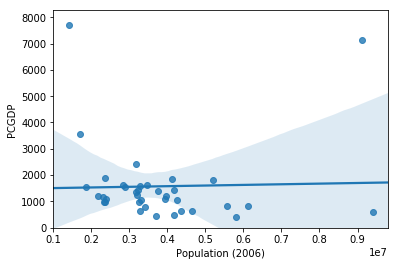

In [11]:
# Is Population size a predictor of how prosperous a state is?
sns.regplot(x="Population (2006)", y="PCGDP", data=new_data)
plt.ylim(0,)

In [12]:
# To examine the Correlation between Population size and per Capita GDP
new_data[["Population (2006)", "PCGDP"]].corr()

,Population (2006),PCGDP
Population (2006),1.000000,0.027141
PCGDP,0.027141,1.000000


_Both the Scatter Plot line and the Correlation Coefficient at 0.027 show clearly that the relationship between Population and prosperity of the states is very very weak. It is therefore safe to say that how large or small the population is, is not an indication of how prosperous the state is._

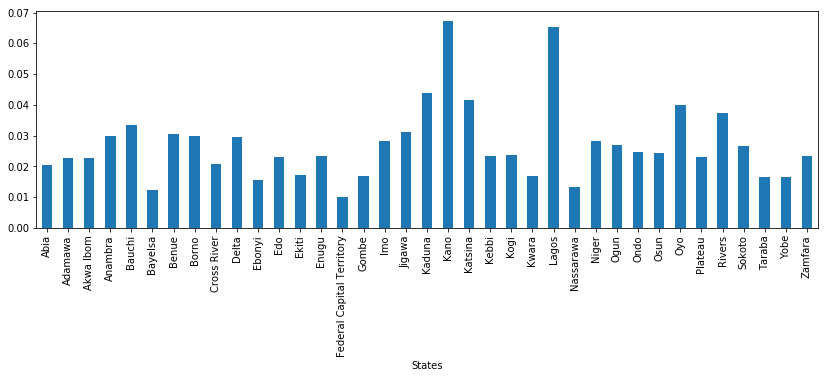

In [13]:
# To make 'State' the index coloum before visualizing the data
df1 = new_data.set_index('States')

# To visualize the population using a bar chart
df1['pop_proportion'].plot(kind='bar', figsize=(14, 4))
plt.title = ('Population in year 2006')
plt.xlabel = ('States in Nigeria')
plt.ylabel = ('population')
plt.show()

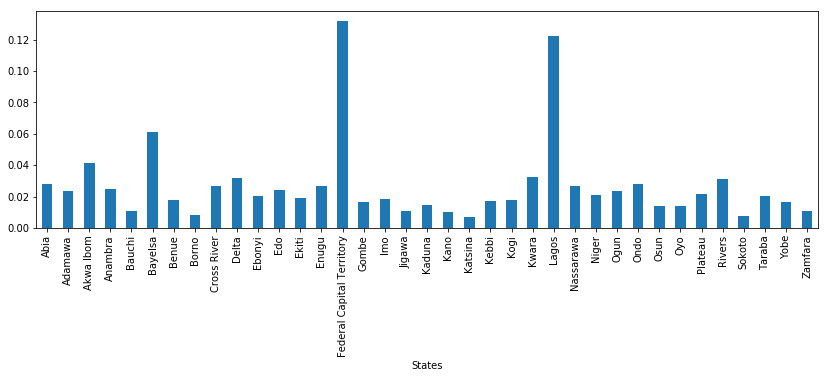

In [14]:
## To visualize the per Capita GDP of Nigeria States
df1['%pcGDP'].plot(kind='bar', figsize=(14, 4))
plt.title = ('Percentage per capita GDP')
plt.xlabel = ('States in Nigeria')
plt.ylabel = ('per Capita GDP')
plt.show()

___From the visualize analysis of the data, it appears two states have the highest population in Nigeria and as such they will be of keen interest to be investment destinations. However, in terms of per Capita GDP, two states also stand out. If we combine the outcome of the two analysis, it appears Lagos State has both fairly high population and also per Capita GDP.___

### I will read the json file of Nigera states from Carto and use same to visualize the Choropleth map of Nigeria population and per Capita GDP

In [15]:
# The code was removed by Watson Studio for sharing.

In [16]:
from ibm_botocore.client import Config
import ibm_boto3
cos = ibm_boto3.client(service_name='s3',
    ibm_api_key_id=credentials_1['IBM_API_KEY_ID'],
    ibm_service_instance_id=credentials_1['IAM_SERVICE_ID'],
    ibm_auth_endpoint=credentials_1['IBM_AUTH_ENDPOINT'],
    config=Config(signature_version='oauth'),
    endpoint_url=credentials_1['ENDPOINT'])

In [17]:
cos.download_file(Bucket=credentials_1['BUCKET'],Key='nigeria_states.geojson',Filename='nigeria_states.geojson') 

In [18]:
ngr_geo = r'nigeria_states.geojson' # to read the geojson file and store

In [19]:
with open (ngr_geo, encoding = "utf8") as f:
    map_data = f.readlines()
    map_data = [json.loads(line) for line in map_data]
    map_data = map_data[0]

In [20]:
[key for key in map_data['features'][0]['properties']]

['cartodb_id',
 'id_0',
 'iso',
 'name_0',
 'id_1',
 'name_1',
 'varname_1',
 'nl_name_1',
 'hasc_1',
 'cc_1',
 'type_1',
 'engtype_1',
 'validfr_1',
 'validto_1',
 'remarks_1',
 'shape_leng',
 'shape_area']

In [21]:
# To obtain the geographical coordinates of Nigeria
Nigeria = 'Nigeria'
geolocator = Nominatim(user_agent='myGeocoder')
location = geolocator.geocode(Nigeria)
lat = location.latitude
lng = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(lat, lng))

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [22]:
# Choropleth map of Nigeria using the population proportion 

ngr_map = folium.Map([lat, lng], tiles='cartodbpositron', zoom_start=6)
    
ngr_map.choropleth(
    geo_data = ngr_geo,
    name = 'choropleth',
    data = new_data,
    columns = ['States', 'pop_proportion'],
    key_on = 'feature.properties.name_1',
    fill_color = 'YlGn',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = '2006 Population Proportion of Nigeria states',
    highlight = True
)
folium.LayerControl().add_to(ngr_map)

ngr_map

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [23]:
# The map showing the percentage per Capital GDP

ngr_map = folium.Map([lat, lng], tiles='cartodbpositron', zoom_start=6)
    
ngr_map.choropleth(
    geo_data = ngr_geo,
    name = 'choropleth',
    data = new_data,
    columns = ['States', '%pcGDP'],
    key_on = 'feature.properties.name_1',
    fill_color = 'YlGn',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = '% per Capita GDP in all Nigeria 36 states and Federal capital Territory',
    highlight = True
)

folium.LayerControl().add_to(ngr_map)

ngr_map

### From the visuals, it is clear that the state that appears to have have met the brief is Lagos State with high population and high per Capital income. The State will now be explored to see the neighborhoods and different venues and places that could attract interest using the Foursuare API.

## Lagos State
There are 20 local government areas in Lagos State with many major districts that will simply be referred to as Areas for the purpose of this work and available data. The data for these areas and their Zip Codes are obtained from [here](https://supernigeria.com/lagos-postal-code). The data will be cleaned up and the geolocation coordinates will be accessed using Nominatim geopandas.

In [35]:
df = pd.read_html('https://supernigeria.com/lagos-postal-code/')[0]
df.head()

,Area,Zip codes
0,Lagos Town Area,NaN
1,Muritala Mohammed Airport,100272.0
2,Onikan,101231.0
3,Isaga Tedo,100263.0
4,Ogba Aguda,100218.0


In [36]:
df = df.dropna(how = 'any') #to drop NaN
df.shape

(96, 2)

In [26]:
df.tail(50)

,Area,Zip codes
47,Lawanson,100254.0
48,Surulere Central,101283.0
49,Magodo,100248.0
50,Ipaja,100278.0
51,Oremeji Ifako,100241.0
52,Onipanu,100252.0
53,Mende,100211.0
54,Olodi Apapa,102241.0
55,Egan,100268.0
56,Kirikiri Industrial,100272.0


In [27]:
df.head(50)

,Area,Zip codes
1,Muritala Mohammed Airport,100272.0
2,Onikan,101231.0
3,Isaga Tedo,100263.0
4,Ogba Aguda,100218.0
5,Marina,100221.0
6,Ojodu,100213.0
7,Onike,100213.0
8,Ijeshatedo,101282.0
9,Broad Street,100221.0
10,Oshodi,100261.0


Some of the district area location will be corrected due to native knowledge of these areas and their correct name spellings

In [37]:
df.iloc[0,0] = 'Airport road'
df.iloc[2,0] = 'Isagatedo'
df.iloc[3,0] = 'Aguda'
df.iloc[12,0] = 'Ajao Estate, Isolo'
df.iloc[13,0] = 'Shogunle, Oshodi'
df.iloc[15,0] = 'Yaba'
df.iloc[25,0] = 'Balogun, Lagos Island'
df.iloc[28,0] = 'Festac Town'
df.iloc[52,0] = 'Mende, Maryland'
df.iloc[56,0] = 'Iju Ishaga'
df.iloc[58,0] = 'Anthony Village'
df.iloc[59,0] = 'Orile'
df.iloc[71,0] = 'Idimu'
df.iloc[79,0] = 'Oba Akran, Ikeja'
df.iloc[84,0] = 'Orile Iganmu'
df.iloc[89,0] = 'Ajegunle, Ajeromi-Ifelodun'
df.iloc[93,0] = 'Okokomaiko'
df.iloc[5,0] = 'Iyana Ipaja'
df.iloc[39,0] = 'Ijedodo, Ijegun'
df.iloc[43,0] = 'Epetedo'
df.iloc[31,0] = 'Navy Town, Ojo'
df.iloc[10,0] = 'Allen Avenue, Ikeja'
df.iloc[25,0] = 'Ikotun, Egbe'

In [38]:
df['Area']= df['Area'] + ', Lagos, Nigeria' # To make the address complete, I have added 'Lagos, Nigeria' to the Districts.
df.head()

,Area,Zip codes
1,"Airport road, Lagos, Nigeria",100272.0
2,"Onikan, Lagos, Nigeria",101231.0
3,"Isagatedo, Lagos, Nigeria",100263.0
4,"Aguda, Lagos, Nigeria",100218.0
5,"Marina, Lagos, Nigeria",100221.0


In [30]:
locator = Nominatim(user_agent='myGeocoder')

In [31]:
# conveneint function to delay between geocoding calls
geocode = RateLimiter(locator.geocode, min_delay_seconds=1)

In [39]:
# The geocode will be appied to the 'Area' to obtain the location of each area
# lambda will be used to create longitude, latitude and altitude from location column
df['location'] = df['Area'].apply(geocode)
df['point'] = df['location'].apply(lambda loc: tuple(loc.point) if loc else None)

In [40]:
df.head()

,Area,Zip codes,location,point
1,"Airport road, Lagos, Nigeria",100272.0,"(Airport Road, Ikeja, Lagos, 100282, Nigeria, ...","(6.5895491, 3.3356811, 0.0)"
2,"Onikan, Lagos, Nigeria",101231.0,"(Onikan Road, Lagos, Lagos Island, Lagos, 2476...","(6.4433031, 3.4037056, 0.0)"
3,"Isagatedo, Lagos, Nigeria",100263.0,"(Isagatedo, Oshodi/Isolo, Lagos, 100263, Niger...","(6.526667, 3.325833, 0.0)"
4,"Aguda, Lagos, Nigeria",100218.0,"(Aguda, Ikeja, Lagos, 100581, Nigeria, (6.6346...","(6.634641, 3.3540057, 0.0)"
5,"Marina, Lagos, Nigeria",100221.0,"(Lagos, Lagos Island, Lagos, 100242, Nigeria, ...","(6.4550575, 3.3941795, 0.0)"


In [41]:
df = df.dropna(how = 'any')
df.head()

,Area,Zip codes,location,point
1,"Airport road, Lagos, Nigeria",100272.0,"(Airport Road, Ikeja, Lagos, 100282, Nigeria, ...","(6.5895491, 3.3356811, 0.0)"
2,"Onikan, Lagos, Nigeria",101231.0,"(Onikan Road, Lagos, Lagos Island, Lagos, 2476...","(6.4433031, 3.4037056, 0.0)"
3,"Isagatedo, Lagos, Nigeria",100263.0,"(Isagatedo, Oshodi/Isolo, Lagos, 100263, Niger...","(6.526667, 3.325833, 0.0)"
4,"Aguda, Lagos, Nigeria",100218.0,"(Aguda, Ikeja, Lagos, 100581, Nigeria, (6.6346...","(6.634641, 3.3540057, 0.0)"
5,"Marina, Lagos, Nigeria",100221.0,"(Lagos, Lagos Island, Lagos, 100242, Nigeria, ...","(6.4550575, 3.3941795, 0.0)"


In [42]:
df.shape

(77, 4)

In [43]:
# I will split the point column into latitude, longitude and altitude columns
df[['latitude', 'longitude', 'altitude']] = pd.DataFrame(df['point'].tolist(), index=df.index)
df.head()

,Area,Zip codes,location,point,latitude,longitude,altitude
1,"Airport road, Lagos, Nigeria",100272.0,"(Airport Road, Ikeja, Lagos, 100282, Nigeria, ...","(6.5895491, 3.3356811, 0.0)",6.589549,3.335681,0.0
2,"Onikan, Lagos, Nigeria",101231.0,"(Onikan Road, Lagos, Lagos Island, Lagos, 2476...","(6.4433031, 3.4037056, 0.0)",6.443303,3.403706,0.0
3,"Isagatedo, Lagos, Nigeria",100263.0,"(Isagatedo, Oshodi/Isolo, Lagos, 100263, Niger...","(6.526667, 3.325833, 0.0)",6.526667,3.325833,0.0
4,"Aguda, Lagos, Nigeria",100218.0,"(Aguda, Ikeja, Lagos, 100581, Nigeria, (6.6346...","(6.634641, 3.3540057, 0.0)",6.634641,3.354006,0.0
5,"Marina, Lagos, Nigeria",100221.0,"(Lagos, Lagos Island, Lagos, 100242, Nigeria, ...","(6.4550575, 3.3941795, 0.0)",6.455057,3.394179,0.0


In [44]:
lag_neighborhood = df.drop(['location','point','altitude'], axis = 1)
lag_neighborhood.rename(columns = {'Area':'Neighborhood'}, inplace = True) #To rename the 'Area' heading
lag_neighborhood.head()

,Neighborhood,Zip codes,latitude,longitude
1,"Airport road, Lagos, Nigeria",100272.0,6.589549,3.335681
2,"Onikan, Lagos, Nigeria",101231.0,6.443303,3.403706
3,"Isagatedo, Lagos, Nigeria",100263.0,6.526667,3.325833
4,"Aguda, Lagos, Nigeria",100218.0,6.634641,3.354006
5,"Marina, Lagos, Nigeria",100221.0,6.455057,3.394179


In [45]:
# Obtain the coordinates of Lagos State

lagos_state = 'Lagos, Nigeria'

geolocator = Nominatim(user_agent='myGeocoder')
location = geolocator.geocode(lagos_state)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Lagos State, Nigeria are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Lagos State, Nigeria are 6.4550575, 3.3941795.


In [46]:
## I will use Folium to create the map of Lagos State using the latitude and longtitude values obtained, and also create markers 
## for the local government area
map_lagos = folium.Map(location=[latitude, longitude], zoom_start=10, tiles = 'openstreetmap')

for lat, lng, neib in zip(lag_neighborhood['latitude'], lag_neighborhood['longitude'], lag_neighborhood['Neighborhood']):
    label = '{}'.format(neib)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_lagos)  

map_lagos


### I will define my foursqsuare credentials and make some API calls 

In [49]:
# To define Foursquare credentials and make some API calls
CLIENT_ID = 'xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx' # my Foursquare ID
CLIENT_SECRET = 'xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx' # my Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('My credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

My credentails:
CLIENT_ID: MMGQZ1OEZDILVZVF3YWT4URS4ADSS2PHXF4XSHGTGM31FHOV
CLIENT_SECRET:NGOZF4CBRO3ZEFL3E1UVCKB2WDHWCUEWXW3QV5ZGQ0V3VNNO


In [48]:
## To explore Onikan Area of Lagos
lag_neighborhood.loc[2, 'Neighborhood']

'Onikan, Lagos, Nigeria'

In [50]:
city_latitude = lag_neighborhood.loc[2, 'latitude'] # neighborhood latitude value
city_longitude = lag_neighborhood.loc[2, 'longitude'] # neighborhood longitude value

city_name = lag_neighborhood.loc[2, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(city_name, 
                                                               city_latitude, 
                                                               city_longitude))

Latitude and longitude values of Onikan, Lagos, Nigeria are 6.4433031, 3.4037056.


In [51]:

LIMIT = 100 # limit of number of venues returned by Foursquare API

radius = 800 # define radius

# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    city_latitude, 
    city_longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=MMGQZ1OEZDILVZVF3YWT4URS4ADSS2PHXF4XSHGTGM31FHOV&client_secret=NGOZF4CBRO3ZEFL3E1UVCKB2WDHWCUEWXW3QV5ZGQ0V3VNNO&v=20180605&ll=6.4433031,3.4037056&radius=800&limit=100'

In [52]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5f50e6560c8de740f771ec9b'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Lagos Island',
  'headerFullLocation': 'Lagos Island, Lagos',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 12,
  'suggestedBounds': {'ne': {'lat': 6.4505031072000065,
    'lng': 3.4109378472540275},
   'sw': {'lat': 6.436103092799993, 'lng': 3.3964733527459723}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4c57462a7613b7132e1b91ea',
       'name': 'Muson Centre',
       'location': {'address': 'Onikan',
        'lat': 6.443332659885113,
        'lng': 3.4010839462280273,
        'labeledLatLngs': [{'label': 'display',
          'lat': 6.4433326598

In [54]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [55]:
# Now I am ready to clean the json and structure it into a pandas dataframe.

venues = results['response']['groups'][0]['items']
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Muson Centre,Convention Center,6.443333,3.401084
1,Swe Bar & Lounge,Lounge,6.444631,3.402854
2,Tafawa Balewa Square,Plaza,6.446357,3.401954
3,Ghana High Buka,African Restaurant,6.446439,3.405491
4,The Westwood Hotel,Hotel,6.443487,3.408793


In [56]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

12 venues were returned by Foursquare.


## Analysis <a name="analysis"></a>

### Next is to explore all the cities in Lagos. This is possible due to the fact that Lagos is a geographically small state
### First, let's create a function to repeat the same process to all the neighborhoods in Lagos

In [57]:
def getNearbyVenues(names, latitudes, longitudes, radius=800):
    venues_list=[]
    
    for name, lat, lng in zip(names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [58]:
# Now I will write the code to run the above function on each neighborhood and create a new dataframe called lagcity_venues.

lagcity_venues = getNearbyVenues(names=lag_neighborhood['Neighborhood'],
                                   latitudes=lag_neighborhood['latitude'],
                                   longitudes=lag_neighborhood['longitude']
                                  )
lagcity_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Airport road, Lagos, Nigeria",6.589549,3.335681,KFC MM2,6.584784,3.333221,American Restaurant
1,"Airport road, Lagos, Nigeria",6.589549,3.335681,Mr. Biggs,6.584588,3.333321,Airport Food Court
2,"Airport road, Lagos, Nigeria",6.589549,3.335681,Computer Village,6.595120,3.339652,Electronics Store
3,"Airport road, Lagos, Nigeria",6.589549,3.335681,Bristow helicopters,6.593916,3.334728,Heliport
4,"Airport road, Lagos, Nigeria",6.589549,3.335681,Barcelos portuguese snackbar,6.584736,3.332449,Restaurant


In [59]:
lagcity_venues.shape

(439, 7)

In [60]:
# How many venues were returned for each neighborhood
lagcity_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
"Abule Egba, Lagos, Nigeria",2,2,2,2,2,2
"Abule Ijesha, Lagos, Nigeria",5,5,5,5,5,5
"Abule Okuta, Lagos, Nigeria",6,6,6,6,6,6
"Adeniran Ogunsanya, Lagos, Nigeria",1,1,1,1,1,1
"Agbelekale, Lagos, Nigeria",2,2,2,2,2,2
"Agege, Lagos, Nigeria",4,4,4,4,4,4
"Aguda, Lagos, Nigeria",8,8,8,8,8,8
"Airport road, Lagos, Nigeria",19,19,19,19,19,19
"Ajao Estate, Isolo, Lagos, Nigeria",9,9,9,9,9,9


In [61]:
# No of unique categories
print('There are {} unique categories.'.format(len(lagcity_venues['Venue Category'].unique())))

There are 110 unique categories.


### To analyze each neighborhood.

In [62]:
# one hot encoding
lagcity_onehot = pd.get_dummies(lagcity_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
lagcity_onehot['Neighborhood'] = lagcity_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [lagcity_onehot.columns[-1]] + list(lagcity_onehot.columns[:-1])
lagcity_onehot = lagcity_onehot[fixed_columns]

lagcity_onehot.head()

,Neighborhood,ATM,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Art Gallery,...,Spanish Restaurant,Sports Club,Stadium,Tennis Court,Theater,Tourist Information Center,Trail,Wine Shop,Women's Store,Yoga Studio
0,"Airport road, Lagos, Nigeria",0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,"Airport road, Lagos, Nigeria",0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Airport road, Lagos, Nigeria",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Airport road, Lagos, Nigeria",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"Airport road, Lagos, Nigeria",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [63]:
lagcity_onehot.shape

(439, 111)

In [64]:
# NNow I will group the rows by neighborhood and by taking the mean of the frequency of occurrence of each category
lagcity_grouped = lagcity_onehot.groupby('Neighborhood').mean().reset_index()
lagcity_grouped.head()

,Neighborhood,ATM,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Art Gallery,...,Spanish Restaurant,Sports Club,Stadium,Tennis Court,Theater,Tourist Information Center,Trail,Wine Shop,Women's Store,Yoga Studio
0,"Abule Egba, Lagos, Nigeria",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,"Abule Ijesha, Lagos, Nigeria",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,"Abule Okuta, Lagos, Nigeria",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,"Adeniran Ogunsanya, Lagos, Nigeria",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"Agbelekale, Lagos, Nigeria",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:
lagcity_grouped.shape

(64, 111)

In [66]:
#Let's print each neighborhood along with the top 5 most common venues
num_top_venues = 5

for hood in lagcity_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = lagcity_grouped[lagcity_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abule Egba, Lagos, Nigeria----
              venue  freq
0  Football Stadium   0.5
1             Hotel   0.5
2               ATM   0.0
3      Liquor Store   0.0
4       Music Venue   0.0


----Abule Ijesha, Lagos, Nigeria----
                  venue  freq
0           Bus Station   0.2
1  Fast Food Restaurant   0.2
2                  Park   0.2
3     Convenience Store   0.2
4                 Diner   0.2


----Abule Okuta, Lagos, Nigeria----
                  venue  freq
0           Music Venue  0.17
1     Mobile Phone Shop  0.17
2            Restaurant  0.17
3  Fast Food Restaurant  0.17
4     Convenience Store  0.17


----Adeniran Ogunsanya, Lagos, Nigeria----
           venue  freq
0          Hotel   1.0
1            ATM   0.0
2  Jewelry Store   0.0
3    Music Venue   0.0
4    Music Store   0.0


----Agbelekale, Lagos, Nigeria----
                  venue  freq
0           Bus Station   0.5
1              Bus Stop   0.5
2                   Gym   0.0
3  Gym / Fitness Center   0.0
4 

### Check the 10 most common venues in each neighborhood.

In [67]:
# To put the result above in dataframe
# Below is a function to sort the venues in descending order

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = lagcity_grouped['Neighborhood']

for ind in np.arange(lagcity_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(lagcity_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"Abule Egba, Lagos, Nigeria",Football Stadium,Hotel,Convenience Store,Bus Station,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant
1,"Abule Ijesha, Lagos, Nigeria",Convenience Store,Bus Station,Park,Fast Food Restaurant,Diner,Construction & Landscaping,Bus Stop,Business Service,Café,Campground
2,"Abule Okuta, Lagos, Nigeria",Mobile Phone Shop,Fast Food Restaurant,Restaurant,Convenience Store,Music Venue,Bar,Yoga Studio,Cocktail Bar,Bus Station,Bus Stop
3,"Adeniran Ogunsanya, Lagos, Nigeria",Hotel,Yoga Studio,Convention Center,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant,Clothing Store
4,"Agbelekale, Lagos, Nigeria",Bus Station,Bus Stop,Convention Center,Business Service,Café,Campground,Candy Store,Chinese Restaurant,Clothing Store,Cocktail Bar


### I will run k-means to cluster the neighborhood into 5 clusters.

In [68]:
# set number of clusters
kclusters = 5

lagcity_grouped_clustering = lagcity_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(lagcity_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([3, 0, 0, 3, 0, 3, 0, 0, 3, 2], dtype=int32)

### I will create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [69]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


In [70]:

lagcity_merged = lag_neighborhood

# merge lagcity_grouped with lag_neighborhood to add latitude/longitude for each neighborhood
lagcity_merged = lagcity_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

lagcity_merged.head() # check the last columns

,Neighborhood,Zip codes,latitude,longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,"Airport road, Lagos, Nigeria",100272.0,6.589549,3.335681,0.0,Airport Terminal,Airport Lounge,Restaurant,Breakfast Spot,Electronics Store,Men's Store,Bookstore,Hotel,Shopping Mall,Heliport
2,"Onikan, Lagos, Nigeria",101231.0,6.443303,3.403706,0.0,Harbor / Marina,Plaza,Hotel,Convention Center,African Restaurant,Pizza Place,Fast Food Restaurant,Stadium,Lounge,Clothing Store
3,"Isagatedo, Lagos, Nigeria",100263.0,6.526667,3.325833,0.0,BBQ Joint,Wine Shop,Restaurant,Yoga Studio,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant
4,"Aguda, Lagos, Nigeria",100218.0,6.634641,3.354006,0.0,Convenience Store,Chinese Restaurant,Food Court,BBQ Joint,Theater,Field,Candy Store,Beer Garden,Comfort Food Restaurant,Cocktail Bar
5,"Marina, Lagos, Nigeria",100221.0,6.455057,3.394179,0.0,Fast Food Restaurant,Park,Photography Studio,Burger Joint,Baseball Stadium,Boat or Ferry,Soccer Field,Market,Chinese Restaurant,Candy Store


In [71]:
lagcity_merged = lagcity_merged.dropna(how = 'any') #drop rows that have no data/nan

In [72]:
lagcity_merged['Cluster Labels'] = lagcity_merged['Cluster Labels'].astype(int) # convert the coulm to integer
lagcity_merged.head()

,Neighborhood,Zip codes,latitude,longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,"Airport road, Lagos, Nigeria",100272.0,6.589549,3.335681,0,Airport Terminal,Airport Lounge,Restaurant,Breakfast Spot,Electronics Store,Men's Store,Bookstore,Hotel,Shopping Mall,Heliport
2,"Onikan, Lagos, Nigeria",101231.0,6.443303,3.403706,0,Harbor / Marina,Plaza,Hotel,Convention Center,African Restaurant,Pizza Place,Fast Food Restaurant,Stadium,Lounge,Clothing Store
3,"Isagatedo, Lagos, Nigeria",100263.0,6.526667,3.325833,0,BBQ Joint,Wine Shop,Restaurant,Yoga Studio,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant
4,"Aguda, Lagos, Nigeria",100218.0,6.634641,3.354006,0,Convenience Store,Chinese Restaurant,Food Court,BBQ Joint,Theater,Field,Candy Store,Beer Garden,Comfort Food Restaurant,Cocktail Bar
5,"Marina, Lagos, Nigeria",100221.0,6.455057,3.394179,0,Fast Food Restaurant,Park,Photography Studio,Burger Joint,Baseball Stadium,Boat or Ferry,Soccer Field,Market,Chinese Restaurant,Candy Store


### To visualize the map of the Cluster

In [73]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(lagcity_merged['latitude'], lagcity_merged['longitude'], lagcity_merged['Neighborhood'], lagcity_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### Now to examine the Clusters in the Lagos Neighborhood

In [74]:
lagcity_merged.loc[lagcity_merged['Cluster Labels'] == 0, lagcity_merged.columns[[0] + list(range(5, lagcity_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,"Airport road, Lagos, Nigeria",Airport Terminal,Airport Lounge,Restaurant,Breakfast Spot,Electronics Store,Men's Store,Bookstore,Hotel,Shopping Mall,Heliport
2,"Onikan, Lagos, Nigeria",Harbor / Marina,Plaza,Hotel,Convention Center,African Restaurant,Pizza Place,Fast Food Restaurant,Stadium,Lounge,Clothing Store
3,"Isagatedo, Lagos, Nigeria",BBQ Joint,Wine Shop,Restaurant,Yoga Studio,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant
4,"Aguda, Lagos, Nigeria",Convenience Store,Chinese Restaurant,Food Court,BBQ Joint,Theater,Field,Candy Store,Beer Garden,Comfort Food Restaurant,Cocktail Bar
5,"Marina, Lagos, Nigeria",Fast Food Restaurant,Park,Photography Studio,Burger Joint,Baseball Stadium,Boat or Ferry,Soccer Field,Market,Chinese Restaurant,Candy Store
6,"Iyana Ipaja, Lagos, Nigeria",African Restaurant,Bus Stop,Campground,Fast Food Restaurant,Yoga Studio,Convention Center,Business Service,Café,Candy Store,Chinese Restaurant
7,"Onike, Lagos, Nigeria",Food Truck,Seafood Restaurant,Food & Drink Shop,Optical Shop,Art Gallery,Bar,Bus Stop,Business Service,Café,Campground
9,"Broad Street, Lagos, Nigeria",Fast Food Restaurant,Harbor / Marina,Burger Joint,Soccer Field,Photography Studio,Park,Baseball Stadium,Boat or Ferry,Campground,Cocktail Bar
10,"Oshodi, Lagos, Nigeria",Bus Station,Flea Market,Park,Fast Food Restaurant,Shopping Mall,Yoga Studio,Construction & Landscaping,Bus Stop,Business Service,Café
12,"Agbelekale, Lagos, Nigeria",Bus Station,Bus Stop,Convention Center,Business Service,Café,Campground,Candy Store,Chinese Restaurant,Clothing Store,Cocktail Bar


In [75]:
lagcity_merged.loc[lagcity_merged['Cluster Labels'] == 1, lagcity_merged.columns[[0] + list(range(5, lagcity_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
95,"Lekki Area, Lagos, Nigeria",Sports Club,Yoga Studio,Convenience Store,Bus Station,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant


In [76]:
lagcity_merged.loc[lagcity_merged['Cluster Labels'] == 2, lagcity_merged.columns[[0] + list(range(5, lagcity_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
39,"Akesan, Lagos, Nigeria",Convenience Store,Yoga Studio,Convention Center,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant,Clothing Store
55,"Egan, Lagos, Nigeria",Convenience Store,Yoga Studio,Convention Center,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant,Clothing Store


In [77]:
lagcity_merged.loc[lagcity_merged['Cluster Labels'] == 3, lagcity_merged.columns[[0] + list(range(5, lagcity_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
11,"Allen Avenue, Ikeja, Lagos, Nigeria",Hotel,Fast Food Restaurant,Boutique,Office,Pizza Place,Ice Cream Shop,Bakery,BBQ Joint,Shopping Mall,African Restaurant
13,"Ajao Estate, Isolo, Lagos, Nigeria",Hotel,Shopping Mall,Flea Market,BBQ Joint,Fast Food Restaurant,Pizza Place,Bank,Comfort Food Restaurant,Cocktail Bar,Clothing Store
22,"Oregun, Lagos, Nigeria",African Restaurant,Trail,Boutique,Beer Garden,Hotel,Yoga Studio,Convenience Store,Business Service,Café,Campground
42,"Abule Egba, Lagos, Nigeria",Football Stadium,Hotel,Convenience Store,Bus Station,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant
44,"Epetedo, Lagos, Nigeria",Wine Shop,Beer Garden,Hotel,Snack Place,Yoga Studio,Convenience Store,Bus Stop,Business Service,Café,Campground
46,"Agege, Lagos, Nigeria",Bus Station,Business Service,Gym,Hotel,Convention Center,Bus Stop,Café,Campground,Candy Store,Chinese Restaurant
50,"Ipaja, Lagos, Nigeria",Convenience Store,Harbor / Marina,Hotel,Market,Yoga Studio,Bus Stop,Business Service,Café,Campground,Candy Store
53,"Mende, Maryland, Lagos, Nigeria",Hotel,Shopping Mall,Movie Theater,Bar,Bakery,BBQ Joint,Burger Joint,Hot Dog Joint,Spa,Tourist Information Center
60,"Orile, Lagos, Nigeria",Gym,Clothing Store,Hotel,Football Stadium,Yoga Studio,Convenience Store,Bus Stop,Business Service,Café,Campground
61,"Ikoyi, Lagos, Nigeria",Hotel,ATM,Bistro,Pool,Department Store,Construction & Landscaping,Bus Stop,Business Service,Café,Campground


In [78]:
lagcity_merged.loc[lagcity_merged['Cluster Labels'] == 4, lagcity_merged.columns[[0] + list(range(5, lagcity_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
72,"Idimu, Lagos, Nigeria",Soccer Field,Yoga Studio,Convenience Store,Bus Station,Bus Stop,Business Service,Café,Campground,Candy Store,Chinese Restaurant


## Results and Discussion <a name = "results"></a>

From the analysis of the 2006 population data of the 36 states in Nigeria and the capital territory, Abuja, two states turned out to have the most population. Kano State with a population of 9.4million people, representing 6.8% of the country’s population while Lagos State follows closely with a population of 9.1million people representing 6.5% of the entire federation population. In terms of per Capita Gross Domestic Product (GDP), two states appear to be the most prosperous in the nation. Lagos State with per Capita GDP of USD7,100 and the Federal Capital Territory with USD7,600. It is therefore clear that Lagos possesses both the strength of population and the purchasing power or prosperity as shown through its per Capita GDP. 
I tried to see if there is any correlation between a state's population and her per Capita GDP. The coefficient of correlation of 0.027 clearly showed that the relationship is very weak. There will therefore be need in the future to investigate why two states with similar population within the same country will have very dissimilar per Capita GDP.
Foursquare API returned about 439 venues in Lagos neighborhood and the data outcome revealed diverse places of interest like restaurants, lounge, hotels, bars, convenience stores, malls, and event centers, among others. The venues are well spread and shows diverse facilities available. The result from KMeans cluster showed the clusters of top 10 most visited venues in 5 different clusters.
It should be noted that the population data and per Capita GDP used are not of the same period, and as such could have slightly affected the outcome of the result. Another major limitation was the unavailability of current data.

## Conclusion <a name="conclusion"></a>

Out of all the clusters, two major neighborhoods in Ikeja mainland district and Lekki Island district of Lagos seem to have heavily concentrated venues of businesses, and as such will be location with very high traffic that is required for business. It is therefore recommended that the investors will find Lagos to be a viable destination point for the opening of chains of supermarket.